Exam Project_Data visualization


Project Description 

In this project we are trying to find what makes a city interesting. We have shortlisted 3 cities - Antwerp, Ghent and Brussels to focus on for now. We would like to give travel and stay suggestions to tourists that intend on visiting these cities. 

Data Description 

Our initial data included the AirBnB listing data for the 3 cities. 

Describe Research Question 



1.   Need to talk about individual contributions ( Must add names ) 
2.   Need to decribe why a particular graph was chosen, what it will answer ESPECIALLY if good practices not followed 
3.   The final "tool" must be helpful in finding patterns in data 
4.   "SCREENCAST" What is that???








1. Average Price Plot: Average price of different room types in three cities


In [0]:
import altair as alt
import numpy as np
import pandas as pd

In [0]:
# import data
url="https://raw.githubusercontent.com/changsheng006/data/master/belgium_airbnb_revised20200511.csv"
airbnb1 = pd.read_csv(url)

In [0]:
# checke dataset (first 10 rows)
airbnb1.head(10)

In [0]:
# check variable name
list(airbnb1.columns) 

In [0]:
# fix the maximum error
alt.data_transformers.enable('default', max_rows=None)

DataTransformerRegistry.enable('default')

In [0]:
alt.Chart(airbnb1).mark_bar(
  size=40,
  cornerRadiusTopLeft=3,
  cornerRadiusTopRight=3
  ).encode(
  x=alt.X('place:N',title='City'),
  y=alt.Y('mean(price):Q',title='Average Price'),
  color='room_type:O'
  ).properties(
    height=200,
    width=400,
    title='Average price of different room types in three cities'
  )

Output hidden; open in https://colab.research.google.com to view.

2. Intereactive Plot


In [0]:
selection = alt.selection_multi(fields=['place'], bind='legend')

alt.Chart(airbnb1).mark_circle().encode(
    alt.X("neighbourhood_cleansed:N",title = 'neighbourhood'),
    alt.Y("minimum_nights:Q"),
    alt.Color('place:N'),
    size='count(neighbourhood_cleansed):Q',
    opacity=alt.condition(selection, alt.value(1), alt.value(0.2))
).add_selection(
    selection
)

alt.Chart(...)

3 map plot


In [0]:
import altair as alt
import numpy as np
import pandas as pd

In [0]:
# fix the maximum error
alt.data_transformers.enable('default', max_rows=None)

DataTransformerRegistry.enable('default')

In [0]:
url='https://raw.githubusercontent.com/changsheng006/data/master/belgium_airbnb_revised20200511.csv'

In [0]:
airbnb = pd.read_csv(url)

In [0]:
import matplotlib.pyplot as plt

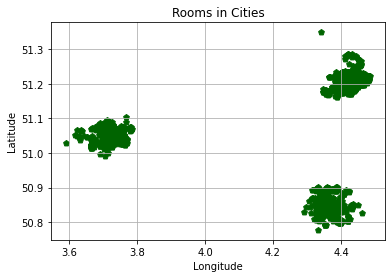

In [0]:
#plot the longitude and latitude
plt.scatter(airbnb.longitude, 
            airbnb.latitude,             
            c = 'darkgreen',             
            marker = 'p') 
plt.xlabel('Longitude') 
plt.ylabel('Latitude') 
plt.title('Rooms in Cities') 
plt.grid() 
plt.show()

In [0]:
# install package for using geopandas
!pip install geopandas
!pip install descartes 

In [0]:
import geopandas as gpd

In [0]:
shapefile = gpd.read_file('BEL_adm3.dbf')

In [0]:
shapefile.head()

,ID_0,ISO,NAME_0,ID_1,NAME_1,ID_2,NAME_2,ID_3,NAME_3,TYPE_3,ENGTYPE_3,NL_NAME_3,VARNAME_3,geometry
0,23,BEL,Belgium,1,Bruxelles,1,Bruxelles,1,Brussel,Arrondissement,Arrondissement,None,Bruxelles,"POLYGON ((4.40986 50.90990, 4.41251 50.90924, ..."
1,23,BEL,Belgium,2,Vlaanderen,2,Antwerpen,2,Antwerpen,Arrondissement,Arrondissement,None,Anvers,"POLYGON ((4.53991 51.48308, 4.54448 51.47944, ..."
2,23,BEL,Belgium,2,Vlaanderen,2,Antwerpen,3,Mechelen,Arrondissement,Arrondissement,None,Malines,"POLYGON ((4.72366 51.15444, 4.72312 51.14762, ..."
3,23,BEL,Belgium,2,Vlaanderen,2,Antwerpen,4,Turnhout,Arrondissement,Arrondissement,None,None,"MULTIPOLYGON (((4.96310 51.45440, 4.96765 51.4..."
4,23,BEL,Belgium,2,Vlaanderen,3,Limburg,5,Hasselt,Arrondissement,Arrondissement,None,None,"POLYGON ((5.28395 51.12883, 5.28372 51.11697, ..."


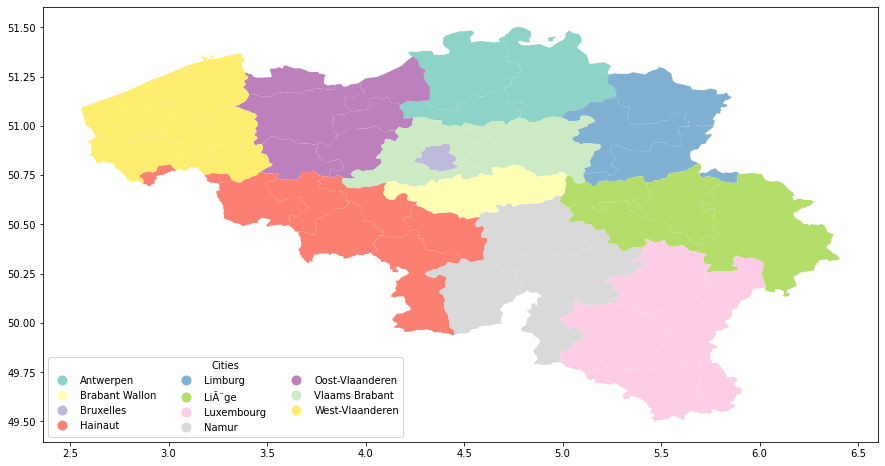

In [0]:
# plot Belgium map
leg_kwds = {'title':"Cities",
            'loc':'lower left',
            'ncol':3}
shapefile.plot(column = 'NAME_2',
               figsize=(16,8),
               cmap='Set3',
               legend=True,
               legend_kwds=leg_kwds)

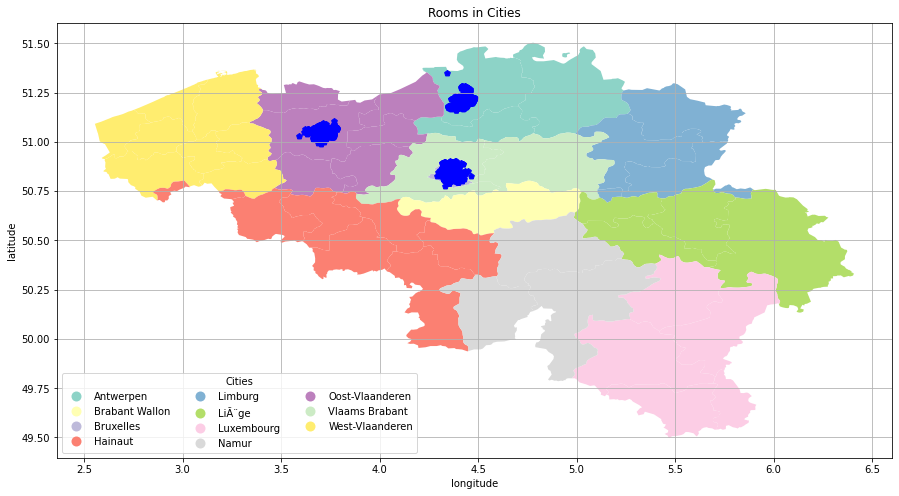

In [0]:
# combine the location of rooms within Belgium map
leg_kwds = {'title':"Cities",
            'loc':'lower left',
            'ncol':3}
shapefile.plot(column = 'NAME_2',
               figsize=(16,8),
               cmap='Set3',
               legend=True,
               legend_kwds=leg_kwds)
plt.scatter(airbnb.longitude, 
            airbnb.latitude,             
            c = 'blue',             
            marker = 'p') 
plt.title('Rooms in Cities') 
plt.grid()
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.show()

In [0]:
# making interactive map plot
# import data
# import city data
url_bru = 'https://raw.githubusercontent.com/changsheng006/data/master/airbnb_brussel.csv'
url_ant = 'https://raw.githubusercontent.com/changsheng006/data/master/airbnb_antwerpen.csv'
url_ghe = 'https://raw.githubusercontent.com/changsheng006/data/master/airbnb_ghent.csv'

In [0]:
data_bru = pd.read_csv(url_bru)
data_ant = pd.read_csv(url_ant)
data_ghe = pd.read_csv(url_ghe)

In [0]:
# subset the small dataset with top 50 rows
data_bru50 = data_bru.head(50)
data_bru50.shape

(50, 87)

In [0]:
# brussel
import folium # construct a map centered at the Eiffel Tower 
city_bru = folium.Map(location = [50.8503,4.3517], zoom_start=18)
# display the map 
display(city_bru)

In [0]:
#create a marker for each room 
#add the host name into the popup
for row in data_bru50.iterrows():     
  row_values = row[1]     
  location = [row_values['latitude'], row_values['longitude']]
  popup = popup = '<strong>' + row_values['host_name'] + '</strong>'      
  marker = folium.Marker(location = location,
                         icon=folium.Icon(color='red', icon='info-sign'),
                         popup = popup)     
  marker.add_to(city_bru)
display(city_bru)

In [0]:
# combine the country map with city information
# country map: Belgium
import folium # construct a map centered at the Eiffel Tower 
country = folium.Map(location = [50.5039,4.4699], zoom_start=8)
# display the map 
display(country)

In [0]:
# create an altair chart, then convert to JSON
price_roomtype_bru = alt.Chart(data_bru).mark_bar(
  size=40,
  cornerRadiusTopLeft=3,
  cornerRadiusTopRight=3
  ).encode(
  x=alt.X('room_type:N',title='Room Type'),
  y=alt.Y('mean(price):Q',title='Average Price'),
  color='room_type:N'
  ).properties(
    height=200,
    width=300,
    title='Average price of different room types'
  ).configure_legend(
  orient='top-right')

price_roomtype_ant = alt.Chart(data_ant).mark_bar(
  size=40,
  cornerRadiusTopLeft=3,
  cornerRadiusTopRight=3
  ).encode(
  x=alt.X('room_type:N',title='Room Type'),
  y=alt.Y('mean(price):Q',title='Average Price'),
  color='room_type:N'
  ).properties(
    height=200,
    width=300,
    title='Average price of different room types'
  ).configure_legend(
  orient='top-right')

price_roomtype_ghe = alt.Chart(data_ghe).mark_bar(
  size=40,
  cornerRadiusTopLeft=3,
  cornerRadiusTopRight=3
  ).encode(
  x=alt.X('room_type:N',title='Room Type'),
  y=alt.Y('mean(price):Q',title='Average Price'),
  color='room_type:N'
  ).properties(
    height=200,
    width=300,
    title='Average price of different room types'
  ).configure_legend(
  orient='top-left')


bru_popup = price_roomtype_bru.to_json()
ant_popup = price_roomtype_ant.to_json()
ghe_popup = price_roomtype_ghe.to_json()

In [0]:
# create a marker, with altair graphic as popup
circ_mkr_bru = folium.CircleMarker(
    location = [50.8503,4.3517],
    radius=20,
    color='red',
    fill=True,
    fill_color='red',
    fillOpacity=1.0,
    opacity=1.0,
    tooltip='Altair Graph',
    popup=folium.Popup(max_width=400).add_child(folium.VegaLite(bru_popup, width=400, height=300)),
)

circ_mkr_ant = folium.CircleMarker(
    location = [51.2194,4.4025],
    radius=20,
    color='blue',
    fill=True,
    fill_color='blue',
    fillOpacity=1.0,
    opacity=1.0,
    tooltip='Altair Graph',
    popup=folium.Popup(max_width=400).add_child(folium.VegaLite(ant_popup, width=400, height=300)),
)

circ_mkr_ghe = folium.CircleMarker(
    location = [51.0543,3.7174],
    radius=20,
    color='yellow',
    fill=True,
    fill_color='yellow',
    fillOpacity=1.0,
    opacity=1.0,
    tooltip='Altair Graph',
    popup=folium.Popup(max_width=400).add_child(folium.VegaLite(ghe_popup, width=400, height=300)),
)

In [0]:
# add to map
circ_mkr_bru.add_to(country)
circ_mkr_ant.add_to(country)
circ_mkr_ghe.add_to(country)

country

Output hidden; open in https://colab.research.google.com to view.

In [1]:
{
  "$schema": "https://vega.github.io/schema/vega-lite/v4.json",
  "description": "A simple bar chart with embedded data.",
  "data": {
    "url":
      "https://raw.githubusercontent.com/changsheng006/data/master/belgium_airbnb_revised20200511.csv"
  },
  "vconcat": [{
    "width": 600,
    "mark": "point",
    "encoding": {
      "x": {
        "field": "price",
        "type": "quantitative",
        "scale": {"domain": {"selection": "my_brush"}},
        "axis": {"title": "price"}
      },
      "y": {"field": "reviews_per_month", "type": "quantitative"}
    }
  }, {
    "width": 600,
    "height":100,
    "mark": "point",
    "selection": {
      "my_brush": {"type": "interval", "encodings": ["x"]}
    },
    "encoding": {
      "x": {
        "field": "price",
        "type": "quantitative"
      },
      "y": {
        "field": "reviews_per_month",
        "type": "quantitative"
      }
    }
  }]
}

{'$schema': 'https://vega.github.io/schema/vega-lite/v4.json',
 'data': {'url': 'https://raw.githubusercontent.com/changsheng006/data/master/belgium_airbnb_revised20200511.csv'},
 'description': 'A simple bar chart with embedded data.',
 'vconcat': [{'encoding': {'x': {'axis': {'title': 'price'},
     'field': 'price',
     'scale': {'domain': {'selection': 'my_brush'}},
     'type': 'quantitative'},
    'y': {'field': 'reviews_per_month', 'type': 'quantitative'}},
   'mark': 'point',
   'width': 600},
  {'encoding': {'x': {'field': 'price', 'type': 'quantitative'},
    'y': {'field': 'reviews_per_month', 'type': 'quantitative'}},
   'height': 100,
   'mark': 'point',
   'selection': {'my_brush': {'encodings': ['x'], 'type': 'interval'}},
   'width': 600}]}